In [ ]:
from PIL import Image, ImageDraw
import os
import matplotlib.pyplot as plt
import glob
import numpy as np
import shutil


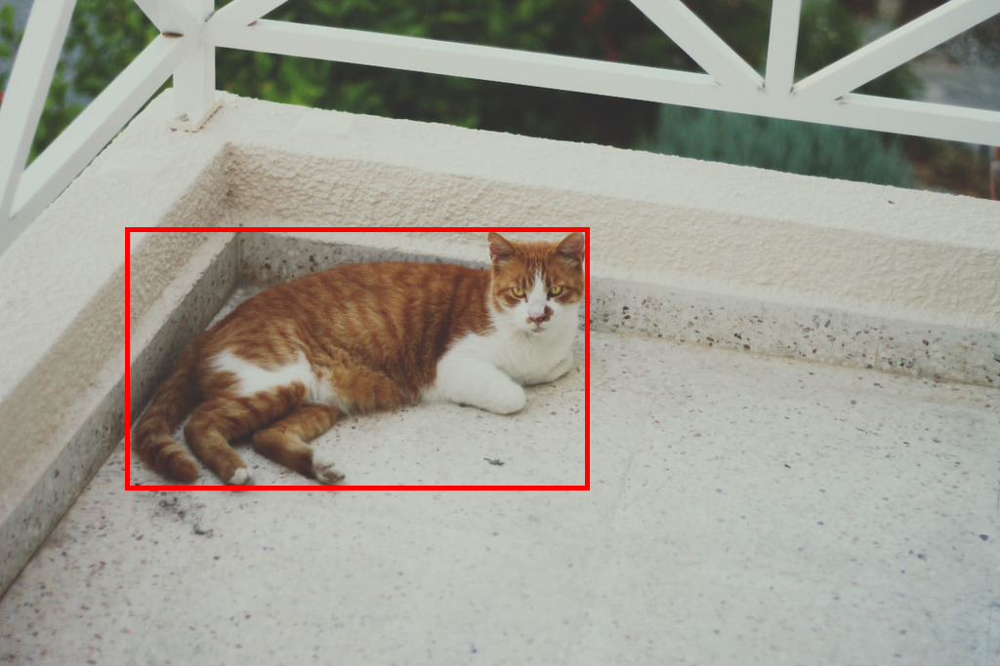

In [3]:
def show_bbox(image_path):
    # convert image path to label path
    label_path = image_path.replace('/images/', '/darknet/').replace('.jpg', '.txt')

    # Open the image and create ImageDraw object for drawing
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    with open(label_path, 'r') as f:
        for line in f.readlines():
            # Split the line into five values
            label, x, y, w, h = line.split(' ')

            # Convert string into float
            x = float(x)
            y = float(y)
            w = float(w)
            h = float(h)

            # Convert center position, width, height into
            # top-left and bottom-right coordinates
            W, H = image.size
            x1 = (x - w/2) * W
            y1 = (y - h/2) * H
            x2 = (x + w/2) * W
            y2 = (y + h/2) * H

            # Draw the bounding box with red lines
            draw.rectangle((x1, y1, x2, y2),
                           outline=(255, 0, 0), # Red in RGB
                           width=5)             # Line width
    image.show()
    

show_bbox("../download/cat/images/0a0df46ca3f886c9.jpg")

In [6]:
if not os.path.exists('./datasets/kikaben_data'):
    for folder in ['images', 'labels']:
        for split in ['train', 'val', 'test']:
            os.makedirs(f'./datasets/kikaben_data/{folder}/{split}')

In [22]:
def get_filenames(folder):
    filenames = set()
    
    for path in glob.glob(os.path.join(folder, '*.jpg')):
        # Extract the filename
        filename = os.path.split(path)[-1]        
        filenames.add(filename)

    return filenames


# Dog and cat image filename sets
dog_images = get_filenames('../download/dog/images')
cat_images = get_filenames('../download/cat/images')

{'0dcd8cc4b35a93b4.jpg', '1417eccd5854e04a.jpg', '0838125199f2caa7.jpg'}


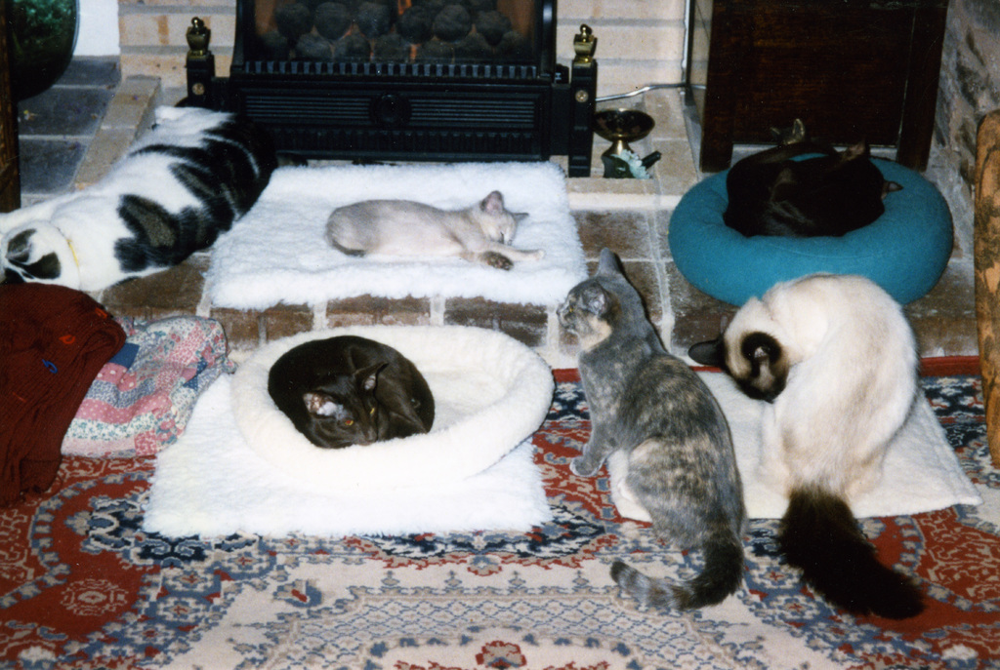

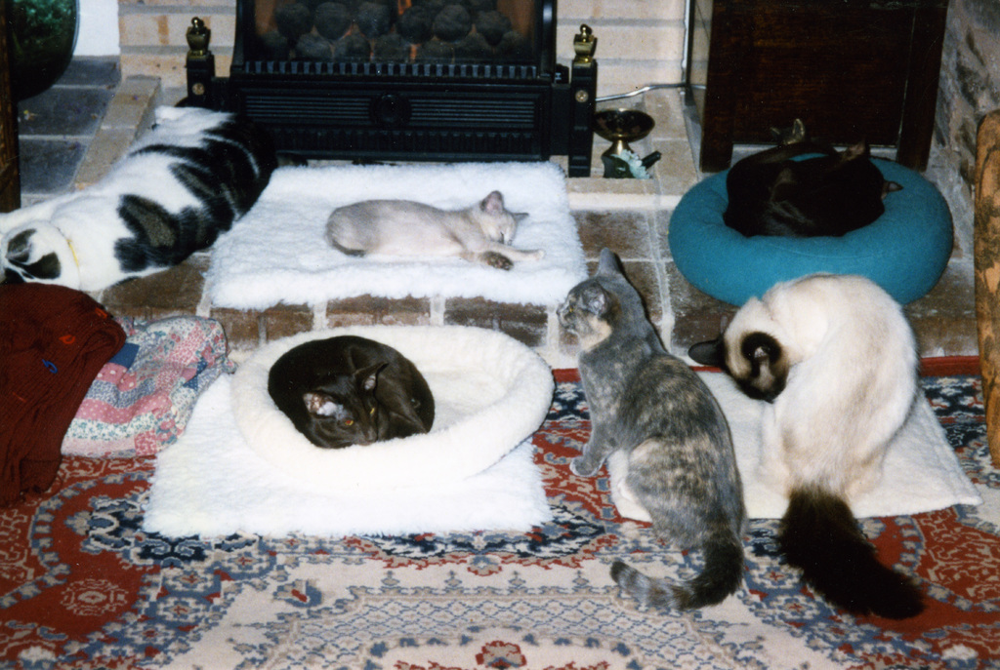

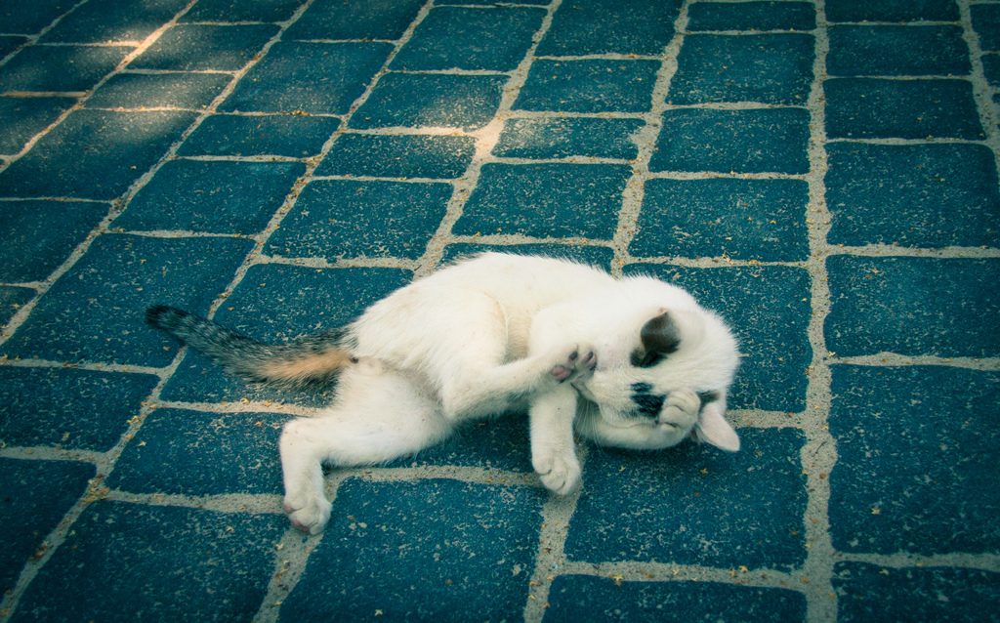

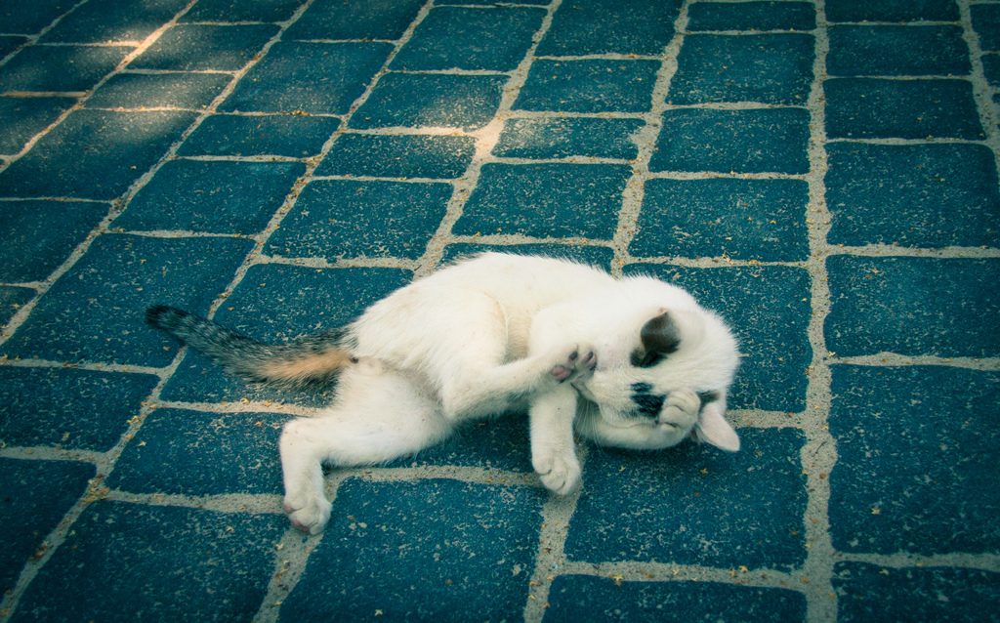

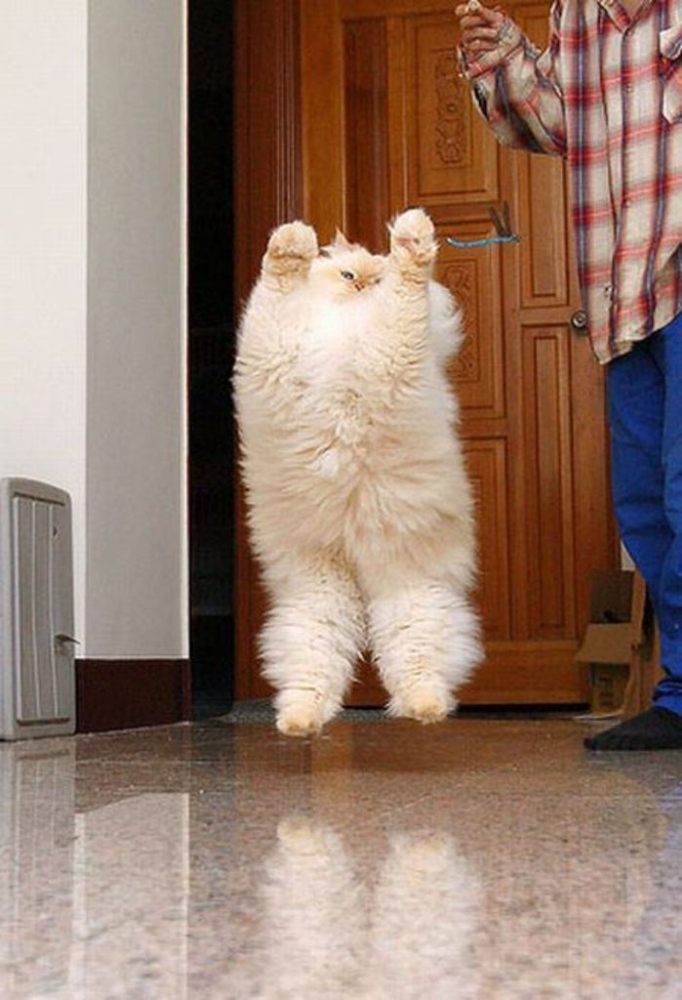

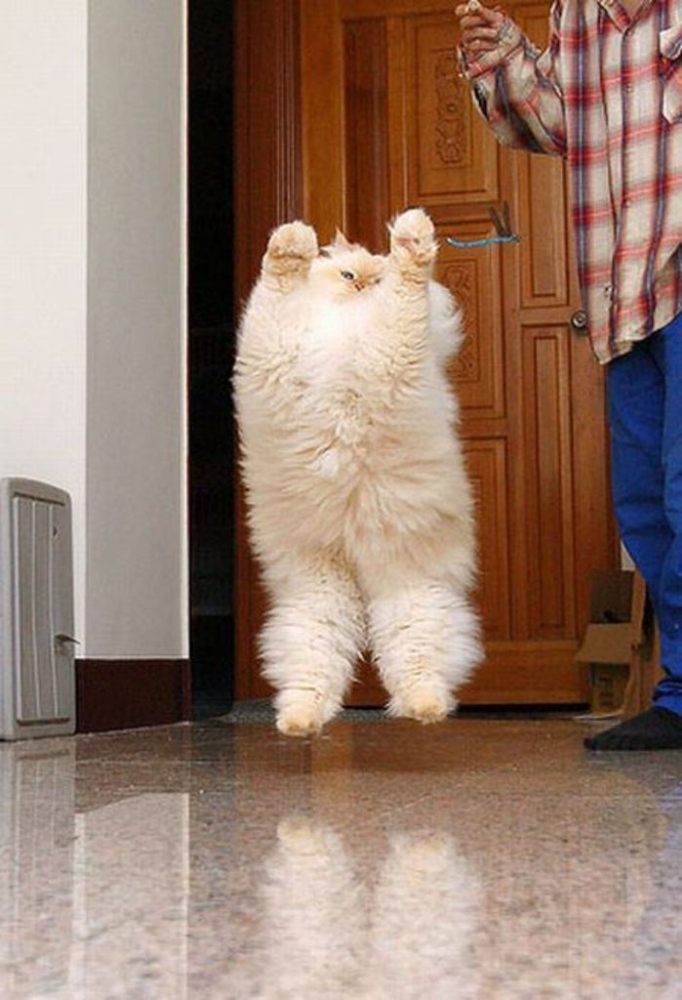

In [23]:
# Check for duplicates
duplicates = dog_images & cat_images

print(duplicates)

# Show the images from the duplicated filenames
def show_duplicates():
    for file in duplicates:
        for animal in ['cat', 'dog']:
            Image.open(f'../download/{animal}/images/{file}').show()

show_duplicates()

In [27]:
dog_images -= duplicates

print(len(dog_images))

497


In [18]:
dog_images = np.array(list(dog_images))
cat_images = np.array(list(cat_images))

# Use the same random seed for reproducability
np.random.seed(42)
np.random.shuffle(dog_images)
np.random.shuffle(cat_images)

In [28]:
def split_dataset(animal, image_names, train_size, val_size):
    for i, image_name in enumerate(image_names):
        # Label filename
        label_name = image_name.replace('.jpg', '.txt')
        
        # Split into train, val, or test
        if i < train_size:
            split = 'train'
        elif i < train_size + val_size:
            split = 'val'
        else:
            split = 'test'
        
        # Source paths
        source_image_path = f'../download/{animal}/images/{image_name}'
        source_label_path = f'../download/{animal}/darknet/{label_name}'

        # Destination paths
        target_image_folder = f'datasets/kikaben_data/images/{split}'
        target_label_folder = f'datasets/kikaben_data/labels/{split}'

        # Copy files
        shutil.copy(source_image_path, target_image_folder)
        shutil.copy(source_label_path, target_label_folder)

# Cat data
split_dataset('cat', cat_images, train_size=400, val_size=50)

# Dog data (reduce the number by 1 for each set due to three duplicates)
split_dataset('dog', dog_images, train_size=399, val_size=49)